## Utility Functions

In [1]:
import sys
sys.path.insert(0, '/home/tommytang111/gap-junction-segmentation/code/src')
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
from scipy.ndimage import label
import os
import subprocess
from pathlib import Path
import cv2
from PIL import Image
import sys
from utils import *
from models import UNet, TestDataset

### Split section into tiles

In [4]:
def split_img(img:np.ndarray, offset=256, tile_size=512, names=False):
    """ 
    Splits an image into tiles of a specified size, with an optional offset to remove borders.
    
    Parameters:
        img (np.ndarray): Input image as a NumPy array.
        offset (int): Number of pixels to crop from each border before splitting.
        tile_size (int): Size of each square tile.
        names (bool): If True, also returns a list of tile names.

    Returns:
        list: List of image tiles (np.ndarray).
        list (optional): List of tile names if names=True.

    Example:
        tiles, names = split_img(image, offset=0, tile_size=512, names=True)
    """
    if offset:
        img = img[offset:-offset, offset:-offset]
    imgs = []
    names_list = []
    for i in range(0, img.shape[0], tile_size):
        for j in range(0, img.shape[1], tile_size):
            imgs.append(img[i:i+tile_size, j:j+tile_size])
            names_list.append("Y{}_X{}".format(i//tile_size, j//tile_size))
    return (imgs, names_list) if names else imgs

### Write tiles to file

In [5]:
def write_imgs(source_path:str, target_path:str, suffix:str="", index:int=1):
    """
    Splits all images in a source directory into smaller tiles and saves them to a target directory.

    For each image in the source directory, this function:
      - Reads the image in grayscale.
      - Splits the image into 512x512 tiles (with no offset).
      - Saves each tile to the target directory, naming each tile using the original filename's stem,
        the provided suffix, the tile index, and the original file extension.

    If the target directory exists, it will be cleared before saving new tiles.

    Parameters:
        source_path (str): Path to the directory containing source images.
        target_path (str): Path to the directory where split tiles will be saved.
        suffix (str): Suffix to add to each tile's filename before the index and extension (default: "").
        index (int): Starting index for naming the tiles (default: 1).

    Returns:
        None

    Example:
        write_imgs(
            source_path="/path/to/source",
            target_path="/path/to/target",
            suffix="_part",
            index=1
        )
    """
    if os.path.exists(target_path):
        subprocess.run(f"rm -f {target_path}/*", shell=True)
    else:
        os.makedirs(target_path)

    imgs = os.listdir(source_path)
    
    for img in imgs:
        read_img = cv2.imread(f"{source_path}/{img}", cv2.IMREAD_GRAYSCALE)
        split_imgs = split_img(read_img, offset=0, tile_size=512)
        for i, split in enumerate(split_imgs):
            cv2.imwrite(f"{target_path}/{Path(img).stem}{suffix}{i+index}{Path(img).suffix}", split)

source_path = "/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_full/s200-209/segmentations"
target_path = "/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/gts"

write_imgs(source_path=source_path, target_path=target_path, suffix="_part")


### Assemble section from stitching together tiles

In [4]:
#Old method
!python3 main_processing.py \
  --postprocessing \
  --imgs_dir "/mnt/e/Mishaal/sem_dauer_2/image_export" \
  --preds_dir "/home/tommytang111/results" \
  --output_dir "/home/tommytang111/assembled_results" \
  --img_template SEM_dauer_2_image_export_ \
  --seg_template SEM_dauer_2_image_export_ \
  --Smin 0 --Smax 51 \
  --Ymin 0 --Ymax 17 \
  --Xmin 0 --Xmax 19 \
  --offset 0

python3: can't open file '/home/tommytang111/gap-junction-segmentation/code/notebooks/main_processing.py': [Errno 2] No such file or directory


In [6]:
#New method
def assemble_imgs(img_dir:str, gt_dir:str, pred_dir:str, save_dir:str, img_templ:str, seg_templ:str, s_range:range, x_range:range, y_range:range, missing_dir:str=None):
    """
    Assembles (stitches together) image tiles back into full sections.
    
    Parameters:
        img_dir (str): Directory containing image tiles
        gt_dir (str): Directory containing ground truth tiles (can be None)
        pred_dir (str): Directory containing prediction tiles
        save_dir (str): Directory to save assembled results
        missing_dir (str): Directory to copy missing tiles from (optional)
        img_templ (str): Template for image filenames
        seg_templ (str): Template for segmentation filenames
        s_range (range): Range of section indices
        x_range (range): Range of X tile indices
        y_range (range): Range of Y tile indices
    
    Returns:
        None
    """
    from tqdm import tqdm
    import shutil
    
    # Create save directory if it doesn't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    for s in s_range:
        s_acc_img, s_acc_pred, s_acc_gt = [], [], []
        
        for y in tqdm(y_range, desc=f"Processing section {s}"):
            y_acc_img, y_acc_pred, y_acc_gt = [], [], []
            
            for x in x_range:
                # Create filename suffix
                suffix = f"s{str(s).zfill(3)}_Y{y}_X{x}"
                
                # Handle missing images
                img_path = os.path.join(img_dir, img_templ + suffix + ".png")
                if not os.path.isfile(img_path):
                    if missing_dir is not None:
                        shutil.copy(os.path.join(missing_dir, img_templ + suffix + ".png"), img_path)
                    else:
                        raise FileNotFoundError(f"Missing image {img_templ + suffix + '.png'}")
                
                # Load image
                im = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if im is None:
                    raise ValueError(f"Could not load image: {img_path}")
                
                # Load ground truth if directory provided
                gt = None
                if gt_dir:
                    gt_path = os.path.join(gt_dir, seg_templ + suffix + "_label.png")
                    if os.path.isfile(gt_path):
                        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
                    else:
                        gt = np.zeros_like(im)
                
                # Load prediction
                pred_path = os.path.join(pred_dir, img_templ + suffix + "_pred.png")
                if os.path.isfile(pred_path):
                    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
                else:
                    pred = np.zeros_like(im)
                
                # Ensure all arrays have the same shape
                if gt is not None and gt.shape != im.shape:
                    gt = np.zeros_like(im)
                if pred.shape != im.shape:
                    pred = np.zeros_like(im)
                
                # Append to row accumulators
                y_acc_img.append(im)
                y_acc_pred.append(pred)
                if gt_dir:
                    y_acc_gt.append(gt)
            
            # Concatenate row tiles horizontally
            if y_acc_img:  # Check if we have any tiles
                s_acc_img.append(np.concatenate(y_acc_img, axis=1))
                s_acc_pred.append(np.concatenate(y_acc_pred, axis=1))
                if gt_dir:
                    s_acc_gt.append(np.concatenate(y_acc_gt, axis=1))
        
        # Concatenate all rows vertically to form complete section
        if s_acc_img:  # Check if we have any rows
            assembled_img = np.concatenate(s_acc_img, axis=0)
            assembled_pred = np.concatenate(s_acc_pred, axis=0)
            if gt_dir:
                assembled_gt = np.concatenate(s_acc_gt, axis=0)
            
            # Create output filename suffix
            out_suffix = f"s{str(s).zfill(3)}"
            
            # Save assembled results
            cv2.imwrite(os.path.join(save_dir, img_templ + out_suffix + "_img.png"), assembled_img)
            cv2.imwrite(os.path.join(save_dir, img_templ + out_suffix + "_pred.png"), assembled_pred)
            if gt_dir:
                cv2.imwrite(os.path.join(save_dir, seg_templ + out_suffix + "_label.png"), assembled_gt)
            
            print(f"Saved assembled section {s} with shape {assembled_img.shape}")


# assemble_imgs(
#     img_dir="/mnt/e/Mishaal/sem_dauer_2/image_export",
#     gt_dir="/path/to/ground_truth",  # or None if no ground truth
#     pred_dir="/home/tommytang111/results",
#     save_dir="/home/tommytang111/assembled_results",
#     img_templ="SEM_dauer_2_image_export_",
#     seg_templ="SEM_dauer_2_image_export_",
#     s_range=range(0, 51),
#     x_range=range(0, 19),
#     y_range=range(0, 17)
# )

### Overlay images on top of each other

In [16]:
def overlay_img(img:str, pred:str):
    """
    Overlay a prediction mask on top of a grayscale image for visualization.

    This function loads a grayscale image and a prediction mask, then overlays the prediction
    on the image with transparency for easy visual inspection.

    Parameters:
        img (str): Path to the grayscale image file.
        pred (str): Path to the prediction mask file (should be same size as img).

    Returns:
        matplotlib.figure.Figure: The matplotlib figure object with the overlay plot.

    Example:
        plot = overlay_img(
            img="/path/to/assembled_img.png",
            pred="/path/to/assembled_pred.png"
        )
    """
    #Read image and prediction as grayscale
    img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(pred, cv2.IMREAD_GRAYSCALE)
    
    #Plot overlaid images
    plot = plt.figure(dpi=300)
    plt.imshow(img, cmap="gray")
    plt.imshow(pred, cmap="gray", alpha=0.4)
    return plot

In [17]:
%matplotlib inline

plot = overlay_img(
    img="/home/tommytang111/gap-junction-segmentation/outputs/assembled_results/s000-050/SEM_dauer_2_image_export_s000_img.png",
    pred="/home/tommytang111/gap-junction-segmentation/outputs/assembled_results/s000-050/SEM_dauer_2_image_export_s000_pred.png"
)

### Preprocessing: Quality check images before training

In [25]:
def laplacian_var_filter(image_path, threshold=250):
    """
    Check if an image is blurry using the Laplacian variance method. Can tune threshold to adjust sensitivity. 
    Current threshold of 400 is a good default for SEM images.
    """
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"Cannot read image: {image_path}")
    laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
    return 'exclude' if laplacian_var < threshold else 'ok'

In [ ]:
#Preferred over laplacian_var_filter
def sobel_filter(image_path, threshold_blur=35, threshold_artifact=25, verbose=False, apply_filter=False):
    """
    Assess image quality by evaluating sharpness and artifact level using the Sobel filter.

    This function computes the gradient magnitude of a grayscale image using the Sobel operator.
    It then uses the mean and standard deviation of the gradient magnitude to determine if the image
    should be excluded due to blurriness or excessive artifacts, or if it is suitable for further use.
    Thresholds can be adjusted for different datasets.

    Parameters:
        image_path (str): Path to the image file to be evaluated.
        threshold_blur (float): Mean gradient threshold below which the image is considered blurry.
        threshold_artifact (float): Standard deviation threshold below which the image is considered to have artifacts.
        verbose (bool): If True, prints the mean and standard deviation of the gradient magnitude.
        apply_filter (bool): If True, returns the mean and standard deviation instead of classification.

    Returns:
        str or tuple: If apply_filter is False, returns 'exclude' if the image is likely blurry or has artifacts,
                      otherwise returns 'ok'. If apply_filter is True, returns (mean_grad, std_grad).

    Raises:
        ValueError: If the image cannot be read from the provided path.

    Example:
        result = sobel_filter('/path/to/image.png')
        if result == 'ok':
            print("Image is suitable for use.")
    """
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Cannot read image: {image_path}")

    # Compute Sobel gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    
    #Get image of pixel-wise sobel-filtered magnitudes
    grad_mag = np.sqrt(sobelx**2 + sobely**2)

    #Get mean and std of gradient magnitude
    mean_grad = grad_mag.mean()
    std_grad = grad_mag.std()

    if verbose:
        print(f"Image: {image_path}, \nMean Gradient: {mean_grad} \nStd Gradient: {std_grad}")

    if apply_filter:
        return grad_mag
    else:
        # These thresholds should be tuned per dataset depending on scale and contrast of images
        # Good EM images (for sem_adult and sem_dauer_2) have:
        # 1. mean_grad > 35 
        # 2. std_grad > 25
        # 3. std_grad < 1.1 * mean_grad (content to noise ratio)
        # 4. std_grad < 56 if mean_grad > 86
        
        if (mean_grad < threshold_blur) or (std_grad < threshold_artifact) or (std_grad > 1.1*mean_grad) or ((std_grad > 56) and (mean_grad < 86)):
            return 'exclude'
        else:
            return 'ok'

In [71]:
#Test sample images (Want to keep img1, img4, img6, img8):
img1= '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-259/imgs/SEM_adult_image_export_s250_part1.png' #Sharp
img2= '/home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X0.png' #Black
img3= '/home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X7.png' #Pure Noise
img4 = '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/imgs/SEM_adult_image_export_s208_part2.png' #Artifacts present
img5 = '/home/tommytang111/gap-junction-segmentation/Figures/high_artifact_example.png' #Much more artifacts
img6 = '/mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s001_Y10_X10.png' #From sem_dauer_2
img7 = '/mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y9_X15.png' #From sem_dauer_2 >50%black
img8 = '/mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y8_X15.png' #From sem_dauer_2
img9 = '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-299/imgs/SEM_adult_image_export_s272_part2.png' #Artifacts present
img10 = '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-299/imgs/SEM_adult_image_export_s272_part4.png' #Artifacts present
image_files = [img1, img2, img3, img4, img5, img6, img7, img8, img9, img10]
sharp_images = [img for img in image_files if sobel_filter(img)=='ok']
sharp_images

['/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-259/imgs/SEM_adult_image_export_s250_part1.png',
 '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/imgs/SEM_adult_image_export_s208_part2.png',
 '/mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s001_Y10_X10.png',
 '/mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y8_X15.png']

In [76]:
img1= '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s225_part6.png'
img2= '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s223_part7.png'
img3= '/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s210_part7.png'
image_files=[img1, img2, img3]


In [77]:
#View sobel gradient values
for i in image_files:
    print(sobel_filter(i, verbose=True))

Image: /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s225_part6.png, 
Mean Gradient: 95.46439734108374 
Std Gradient: 56.828104834818824
ok
Image: /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s223_part7.png, 
Mean Gradient: 94.02420755859417 
Std Gradient: 58.09554739119014
ok
Image: /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs/SEM_adult_image_export2_s210_part7.png, 
Mean Gradient: 89.55872996334782 
Std Gradient: 56.414801447942224
ok


In [ ]:
#Check through all images in a dataset
def check_filtered(folder:str, filter_func=sobel_filter):
    """
    Checks all images in a folder using a specified filter function and reports those that should be excluded.

    Parameters:
        folder (str): Path to the folder containing images to check.
        filter_func (callable): A function that takes an image path and returns 'exclude' if the image should be excluded,
                                or any other value if it should be kept. Default is sobel_filter.

    Returns:
        None. Prints the names of excluded images and a summary count.
    """
    count = 0

    for img in os.listdir(folder):
        if filter_func(os.path.join(folder, img)) == 'exclude':
            print(f"Image {Path(img).name} is excluded.")
            count += 1

    print(f"Total excluded images: {count}/{len(os.listdir(folder))}")

In [80]:
check_filtered('/home/tommytang111/gap-junction-segmentation/data/516imgs_sem_adult/imgs')
#check_filtered('/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-268_area2/imgs')

Image SEM_adult_image_export_s272_part4.png is excluded.
Image SEM_adult_image_export_s272_part2.png is excluded.
Total excluded images: 2/516


Variance of Laplacian for /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-259/imgs/SEM_adult_image_export_s250_part1.png: 2719.7283101180656
Image: /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-259/imgs/SEM_adult_image_export_s250_part1.png, 
Mean Gradient: 126.66841583852839 
Std Gradient: 78.08091662941455


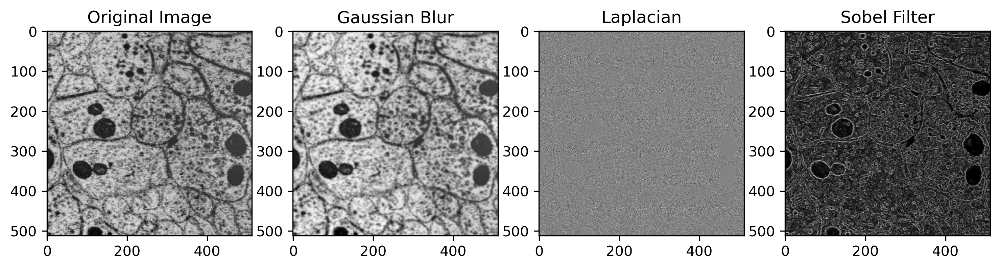

Variance of Laplacian for /home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X0.png: 0.0
Image: /home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X0.png, 
Mean Gradient: 0.0 
Std Gradient: 0.0


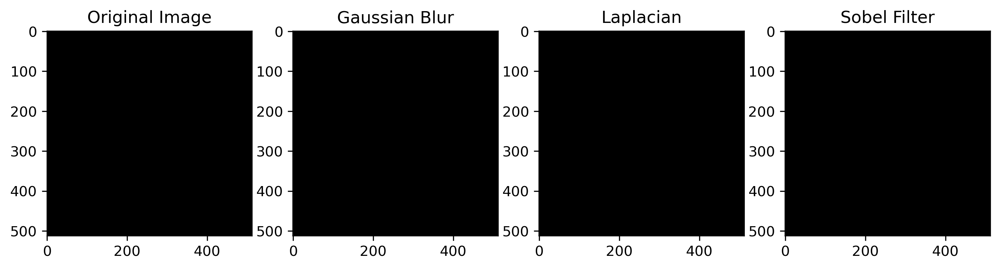

Variance of Laplacian for /home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X7.png: 373.0159014516976
Image: /home/tommytang111/gap-junction-segmentation/data/sem_dauer_2/SEM_split/s110-119/imgs/SEM_dauer_2_export_s110_Y0_X7.png, 
Mean Gradient: 39.00746655491618 
Std Gradient: 20.891626464304522


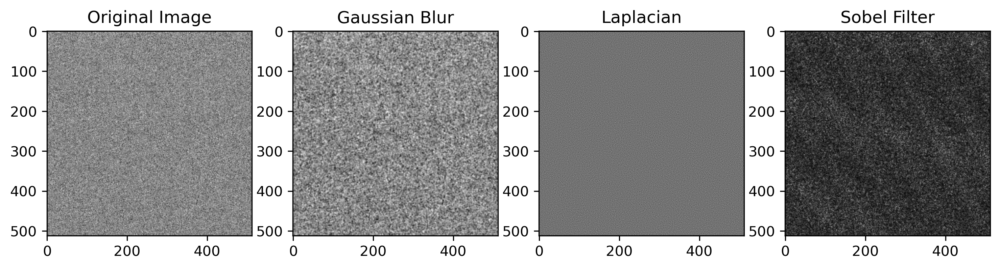

Variance of Laplacian for /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/imgs/SEM_adult_image_export_s208_part2.png: 1837.410077108987
Image: /home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/imgs/SEM_adult_image_export_s208_part2.png, 
Mean Gradient: 110.00428377268285 
Std Gradient: 75.88146565076343


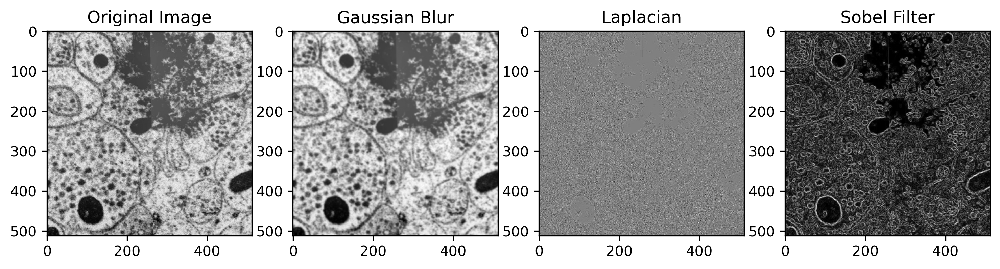

Variance of Laplacian for /home/tommytang111/gap-junction-segmentation/Figures/high_artifact_example.png: 107.04540178224852
Image: /home/tommytang111/gap-junction-segmentation/Figures/high_artifact_example.png, 
Mean Gradient: 31.050136342144324 
Std Gradient: 40.85560239579764


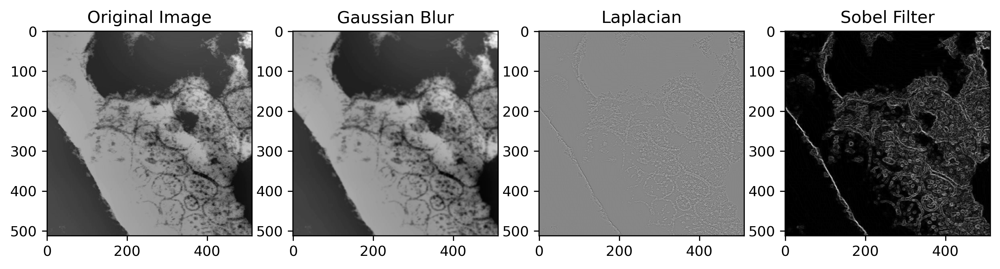

Variance of Laplacian for /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s001_Y10_X10.png: 365.04546530521475
Image: /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s001_Y10_X10.png, 
Mean Gradient: 61.43726155959431 
Std Gradient: 34.164338985523486


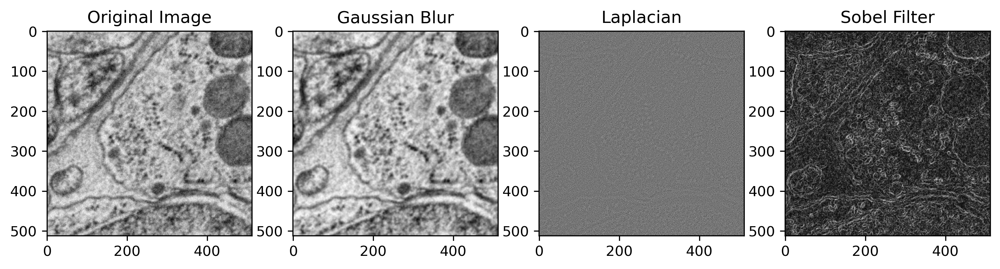

Variance of Laplacian for /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y9_X15.png: 221.8500172728527
Image: /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y9_X15.png, 
Mean Gradient: 33.0227080012398 
Std Gradient: 55.223858694689774


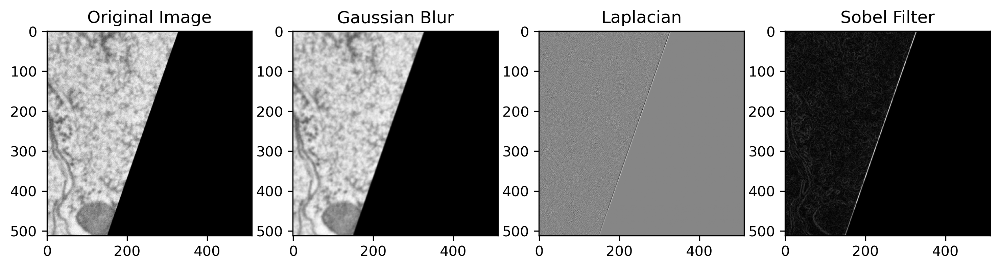

Variance of Laplacian for /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y8_X15.png: 361.0949820213573
Image: /mnt/e/Mishaal/sem_dauer_2/jnc_only_dataset_test/imgs/SEM_dauer_2_image_export_s034_Y8_X15.png, 
Mean Gradient: 54.709299095344484 
Std Gradient: 55.267922847944234


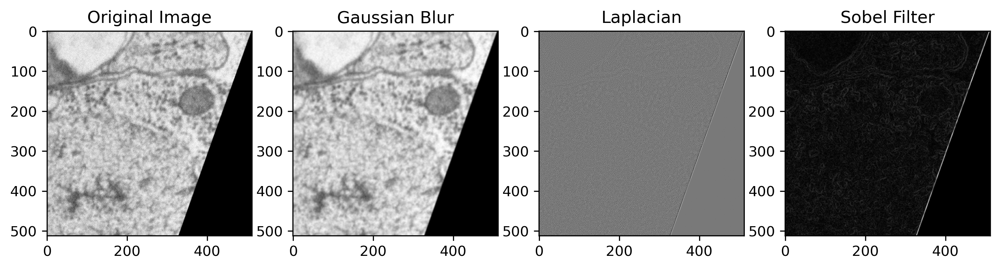

In [21]:
%matplotlib inline

#Add path to utils
sys.path.append('../src')
from utils import resize_image

#Show Gaussian, Laplacian, and Sobel
for img in image_files:
    read_img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    laplacian = cv2.Laplacian(read_img, cv2.CV_64F)
    laplacian_var = laplacian.var()
    print(f"Variance of Laplacian for {img}: {laplacian_var}")\
    #Figure
    plt.figure(dpi=300, figsize=(12, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(read_img, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 4, 2)
    plt.imshow(cv2.GaussianBlur(read_img, (5, 5), 0), cmap='gray')
    plt.title('Gaussian Blur')
    plt.subplot(1, 4, 3)
    plt.imshow(laplacian, cmap='gray')
    plt.title('Laplacian')
    plt.subplot(1, 4, 4)
    plt.imshow(sobel_filter(img, verbose=True, apply_filter=True), cmap='gray')
    plt.title('Sobel Filter')
    plt.show()
    
#For a single image, you can also use the following:    
# b=cv2.imread('/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s250-259/imgs/SEM_adult_image_export_s250_part1.png', cv2.IMREAD_GRAYSCALE)
# #plt.imshow(cv2.Laplacian(b, cv2.CV_64F), cmap='gray')
# plt.imshow(b, cmap='gray')
# print(f"Variance of Laplacian: {cv2.Laplacian(b, cv2.CV_64F).var()}")


In [ ]:
#Crop and save image if required
img = Image.open('/home/tommytang111/gap-junction-segmentation/SEM_adult_image_export_s309.png')
upper_left = img.crop((0,0,512,512))
upper_left.save('/home/tommytang111/gap-junction-segmentation/Figures/high_artifact_example.png')

In [ ]:
def plot_3D(file:str, title:str='Title', xlab:str='X', ylab:str='Y', zlab:str='Z', elev:int=20, azim:int=90, figx:int=10, figy:int=7, dpi:int=None):
    """
    Plots a grayscale image as a 3D surface, where the Z axis represents pixel intensity.

    Parameters:
        file (str): Path to the image file to plot.
        title (str): Title of the plot (default: 'Title').
        xlab (str): Label for the X axis (default: 'X').
        ylab (str): Label for the Y axis (default: 'Y').
        zlab (str): Label for the Z axis (default: 'Z').
        elev (int): Elevation angle in the z plane for the 3D plot view (default: 20).
        azim (int): Azimuth angle in the x,y plane for the 3D plot view (default: 90).
        figx (int): Width of the figure in inches (default: 10).
        figy (int): Height of the figure in inches (default: 7).
        dpi (int, optional): Dots per inch for the figure. If None, uses default.

    Returns:
        None. Displays the 3D surface plot of the image.
    """
    #Load image as grayscale
    img = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
    
    #Get image dimensions
    x_size = img.shape[1]
    y_size = img.shape[0]
    
    #Create X, Y coordinate arrays
    X, Y = np.meshgrid(np.arange(x_size), np.arange(y_size))
    
    fig = plt.figure(figsize=(figx, figy), dpi=dpi)
    ax = plt.axes(projection='3d')
    
    #Plot surface
    surface = ax.plot_surface(X, Y, img, cmap='magma', alpha=0.5)
    ax.set_title(title, y=0.90)
    ax.set_xlabel(xlab)
    ax.set_ylabel(ylab)
    ax.set_zlabel(zlab)
    ax.set_xlim(0, x_size)
    ax.set_ylim(0, y_size)
    ax.set_zlim(0, 255)
    ax.invert_xaxis()
    ax.grid(True)
    ax.set_box_aspect(None, zoom=0.85)
    ax.view_init(elev=elev, azim=azim)
    #ax.contour3D(X, Y, img, 50, cmap='magma', alpha=1)
    #colorbar modifiers
    #surface.set_clim(0, 255)  # Set color limits for the surface
    #cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.3])  
    #fig.colorbar(surface, cax=cbar_ax)
    plt.tight_layout()
    plt.show()

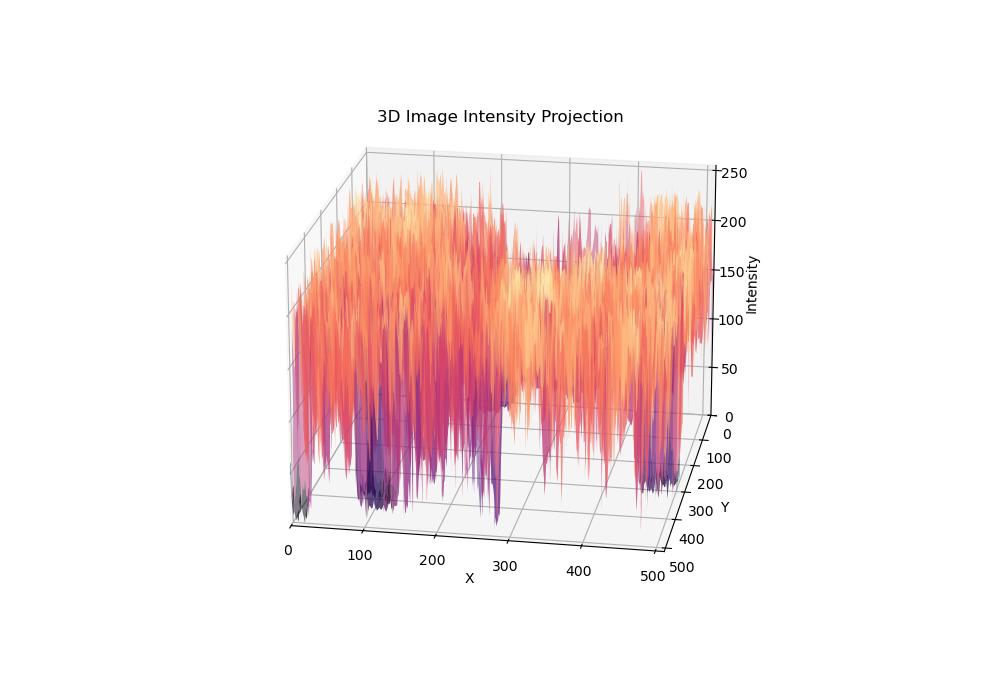

In [95]:
%matplotlib widget

plot_3D('/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/imgs/SEM_adult_image_export_s208_part2.png', 
        title='3D Image Intensity Projection',
        zlab='Intensity',
        azim=100
)

In [ ]:
#Show a sample image
def view_label(file:str):
    """
    Displays a grayscale label, converting all non-zero pixels to 255 (white).

    Parameters:
        file (str): Path to the image file to display.

    Returns:
        None. Shows the processed image using matplotlib.
    """
    img = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
    img[img != 0] = 255
    plt.figure()
    plt.imshow(img, cmap='gray')
    plt.show()

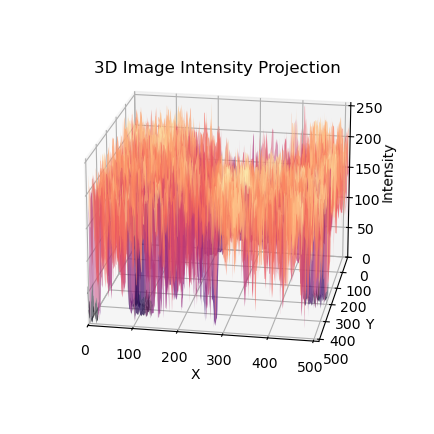

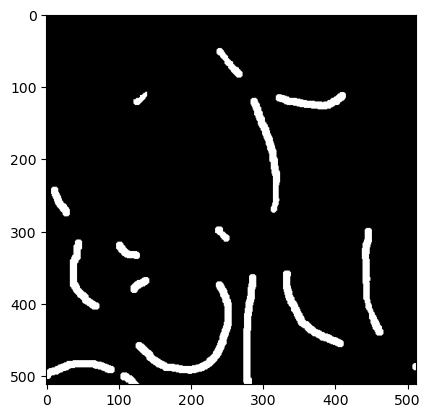

In [97]:
%matplotlib inline
view_label("/home/tommytang111/gap-junction-segmentation/data/sem_adult/SEM_split/s200-209/gts/sem_adult_image_export_s200_part1.png")

### Compare performance across models and effect of zoomout

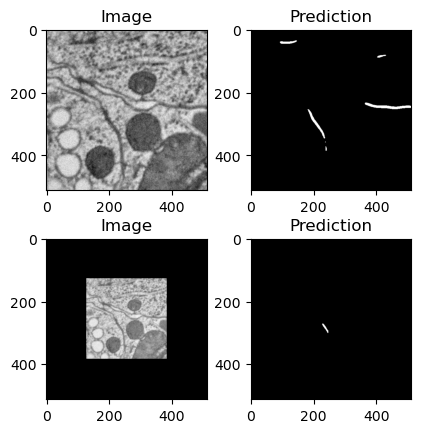

In [2]:
#Plot comparing zoomout and no zoomout
img1 = cv2.imread("/home/tommytang111/gap-junction-segmentation/data/516imgs_sem_dauer_2/imgs/SEM_dauer_2_image_export_s001_Y10_X15.png", cv2.IMREAD_GRAYSCALE)  # shape: (H, W)
img1_zoomout = zoom_out_and_pad(img1)
pred_img1 = single_image_inference(image=img1,
                       model_path='/home/tommytang111/gap-junction-segmentation/models/unet_base_516imgs_sem_adult_ak5v2m7m.pt',
                       model=UNet())
pred_img1_zoomout = single_image_inference(image=img1_zoomout,
                       model_path='/home/tommytang111/gap-junction-segmentation/models/unet_base_516imgs_sem_adult_ak5v2m7m.pt',
                       model=UNet())

plt.figure()
plt.subplot(221)
plt.imshow(img1, cmap='gray')
plt.title('Image')
plt.subplot(222)
plt.imshow(pred_img1, cmap='gray')
plt.title('Prediction')
plt.subplot(223)
plt.imshow(img1_zoomout, cmap='gray')
plt.title('Image')
plt.subplot(224)
plt.imshow(pred_img1_zoomout, cmap='gray')
plt.title('Prediction')
plt.subplots_adjust(wspace=-0.3, hspace=0.3)

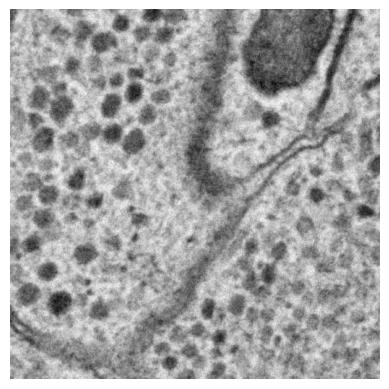

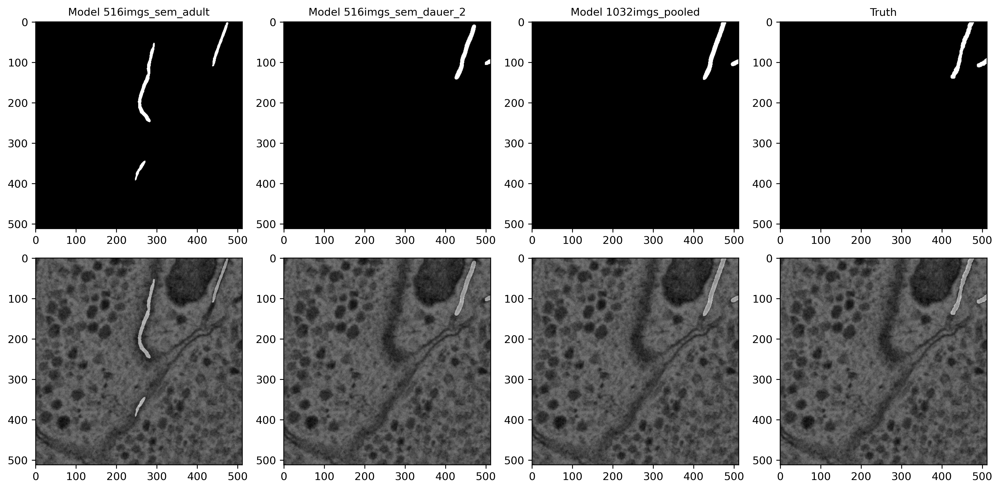

In [3]:
#Plot comparison of performance across models
a, b = predict_multiple_models(model1_path="/home/tommytang111/gap-junction-segmentation/models/unet_base_516imgs_sem_adult_ak5v2m7m.pt",
                        model2_path= "/home/tommytang111/gap-junction-segmentation/models/unet_base_516imgs_sem_dauer_2_95597gne.pt",
                        model3_path= "/home/tommytang111/gap-junction-segmentation/models/unet_base_pooled_516imgs_sem_dauer_2_516imgs_sem_adult_s1mdf621.pt",
                        data_dir="/home/tommytang111/gap-junction-segmentation/data/516imgs_sem_dauer_2")

### Filter out pixels annotated in error

In [100]:
def filter_pixels(img: np.ndarray, size_threshold: int = 8) -> np.ndarray:
    """
    Removes small non-zero pixel islands from a grayscale image.

    For each connected component (island) of non-zero pixels in the input image,
    this function sets all pixels in that component to zero if the component contains
    fewer than the number of pixels defined by size_threshold. Designed for use with grayscale images to filter out small
    annotation errors or noise.

    Parameters:
        img (np.ndarray): Input grayscale image as a NumPy array.
        size_threshold (int): Minimum size of pixel islands to keep (default: 8).

    Returns:
        np.ndarray: The filtered image with small pixel islands removed.
    """
    # Create a copy to avoid modifying the original during iteration
    filtered = img.copy()
    # Label connected components (8-connectivity)
    structure = np.ones((3, 3), dtype=int)
    labeled, num_features = label(img > 0, structure=structure)
    # For each pixel, check if its component has at least 8 pixels
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            if img[y, x] != 0:
                component_label = labeled[y, x]
                if component_label == 0:
                    filtered[y, x] = 0
                    continue
                # Count pixels in this component
                count = np.sum(labeled == component_label)
                if count < size_threshold:
                    filtered[y, x] = 0
    return filtered

Case 1: One non-zero pixel
Image is non-zero: True
After filtering, image is non-zero: False 

Case 2: 8 pixels in a line
Image is non-zero: True
After filtering, image is non-zero: True


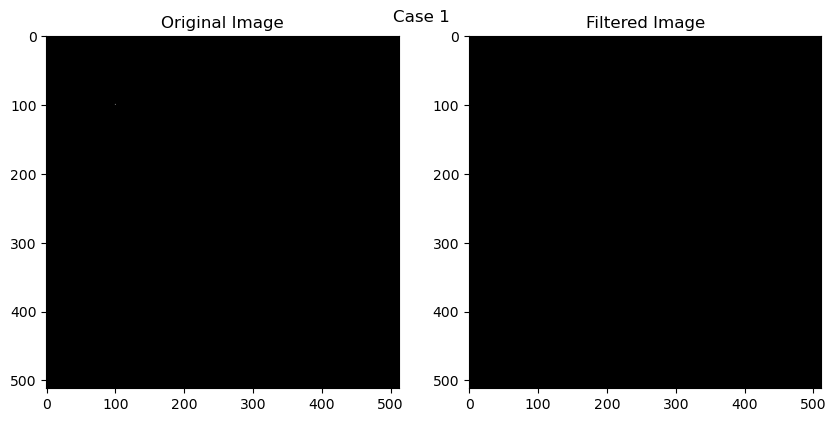

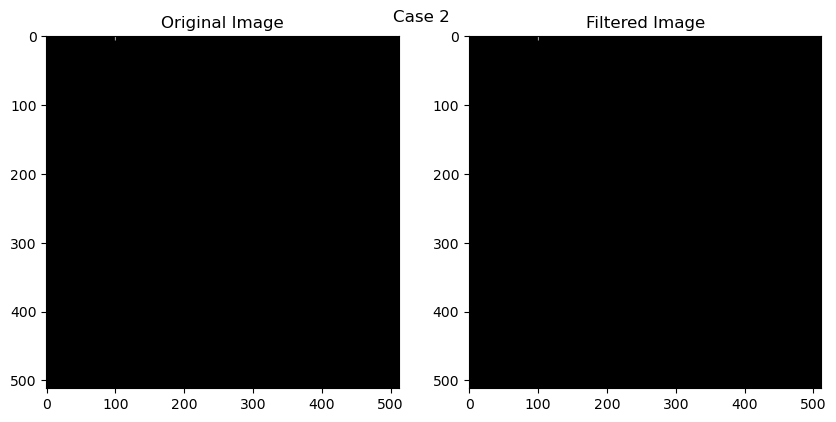

In [104]:
%matplotlib inline

#Test filter_pixels function
a = np.zeros((512, 512), dtype=np.uint8)

#Case 1: One non-zero pixel
a[100, 100] = 255
plt.figure(1, figsize=(10, 5))
plt.suptitle('Case 1', y=0.9)
plt.subplot(121)
plt.title('Original Image')
plt.imshow(a, cmap='gray')
print("Case 1: One non-zero pixel")
print(f"Image is non-zero: {np.any(a != 0)}")

a = filter_pixels(a)
plt.subplot(122)
plt.title('Filtered Image')
plt.imshow(a, cmap='gray')
print(f"After filtering, image is non-zero: {np.any(a != 0)} \n")

#Case 2: 8 pixels in a line
a[0:8, 100] = 255
# a[10:13, 200] = 255
# a[10:13, 201] = 255
# a[10:11, 202] = 255

plt.figure(2, figsize=(10, 5))
plt.suptitle('Case 2', y=0.9)
plt.subplot(121)
plt.title('Original Image')
plt.imshow(a, cmap='gray')
print("Case 2: 8 pixels in a line")
print(f"Image is non-zero: {np.any(a != 0)}")

a = filter_pixels(a)
plt.subplot(122)
plt.title('Filtered Image')
plt.imshow(a, cmap='gray')
print(f"After filtering, image is non-zero: {np.any(a != 0)}")

plt.show()

In [ ]:
#Check if all images are 512x512
def check_img_size(folder:str, target_size=(512, 512)):
    """
    Checks if all images in a folder are of a specified size.

    Parameters:
        folder (str): Path to the folder containing images to check.
        target_size (tuple): Expected size of the images as (height, width).

    Returns:
        None
    """
    count = 0
    for img in os.listdir(folder):
        img_path = os.path.join(folder, img)
        read_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if read_img is None:
            print(f"Could not read image: {img_path}")
            continue
        if read_img.shape != target_size:
            print(f"Image {img} does not match target size {target_size}. Found size: {read_img.shape}")
            count += 1
    print(f'Total images not matching size {target_size}: {count}/{len(os.listdir(folder))}')
        

In [109]:
check_img_size("/home/tommytang111/gap-junction-segmentation/data/pooled_2695imgs_sem_dauer_2_516imgs_sem_adult_split/train/imgs")

Total images not matching size (512, 512): 0/2568


In [ ]:
#Training on sections 250-259 and validating on sections 200-209 using pipeline from unet.py
!python3 unet.py \
--dataset new \
--batch_size 8 \
--focal \
--epochs 100 \
--model_name 2d_gd_mem_run1_model5_epoch149.pk1

ARGS:  ['unet.py', '--dataset', 'new', '--batch_size', '8', '--focal', '--epochs', '100', '--model_name', '2d_gd_mem_run1_model5_epoch149.pk1']
Data loaders created.
Current dataset new
wandb: Currently logged in as: tommytang111 (tommytang111-lunenfeld-tanenbaum-research-institute) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.19.10
wandb: Run data is saved locally in /home/tommytang111/wandb/wandb/run-20250523_171226-joorrbte
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run hardy-serenity-4
wandb: ⭐️ View project at https://wandb.ai/tommytang111-lunenfeld-tanenbaum-research-institute/gap-junction-segmentation
wandb: 🚀 View run at https://wandb.ai/tommytang111-lunenfeld-tanenbaum-research-institute/gap-junction-segmentation/runs/joorrbte
Starting training...
SAVING MODELS TO /home/tommytang111/modelsfocal0
running for 100 epochs
Using device: cuda
100%|█| 5/5 [00:06<00:00,  1.13it/s, loss=Loss: 0.261559